In [1]:
%reload_ext autoreload
%autoreload 2
import pynwb
import os

#DataJoint and DataJoint schema
import datajoint as dj
import numpy as np
import pandas as pd

## We also import a bunch of tables so that we can call them easily

from spyglass.common import (RawPosition, HeadDir, Speed, LinPos, StateScriptFile, VideoFile,
                                  DataAcquisitionDevice, CameraDevice, Probe,
                                  DIOEvents,
                                  ElectrodeGroup, Electrode, Raw, SampleCount,
                                  LFPSelection, LFP, LFPBandSelection, LFPBand,
                                  FirFilter,
                                  IntervalList,
                                  Lab, LabMember, LabTeam, Institution,
                                  BrainRegion,
                                  SensorData,
                                  Session, ExperimenterList,
                                  Subject,
                                  Task, TaskEpoch,
                                  Nwbfile, AnalysisNwbfile, NwbfileKachery, AnalysisNwbfileKachery,
                                  get_electrode_indices)
from spyglass.common.common_position import (PositionInfoParameters,IntervalPositionInfo)
from spyglass.common.common_interval import interval_list_intersect



from plot_lfp import (get_x_y_list, get_speed,get_speed_timestamp, get_pos_timestamp,get_timestamps_and_data,get_electrode_ids,remove_dead_tet_chans,check_for_dead_probes,
                      checking_other_dead_tets,simple_plot,plot_overlay,plot_overlay_with_pos,plot_speed_versus_theta, find_overlapping_times,get_x_y_timestamp_list)

import re
import matplotlib.pyplot as plt
import warnings

warnings.simplefilter('ignore', category=DeprecationWarning)
warnings.simplefilter('ignore', category=ResourceWarning)

from spectral_connectivity import Multitaper
from spectral_connectivity import Connectivity
from spectral_connectivity import multitaper_connectivity

from spectral_connectivity.statistics import fisher_z_transform
from spectral_connectivity.statistics import coherence_bias

Connecting emonroe@lmf-db.cin.ucsf.edu:3306


ModuleNotFoundError: No module named 'spectral_connectivity'

In [8]:
nwb_file_name = 'senor20201030_.nwb'

In [9]:
from spyglass.common.common_position import (IntervalLinearizedPosition, IntervalPositionInfo, TrackGraph)

position_info = (IntervalPositionInfo() &
                 {'nwb_file_name': nwb_file_name,
                  'interval_list_name': 'pos 1 valid times',
                  'position_info_param_name': 'default'}
                ).fetch1_dataframe()
position_info

linear_position_df= (IntervalLinearizedPosition() &
                     {'position_info_param_name': 'default',
                      'nwb_file_name': nwb_file_name,
                      'interval_list_name': 'pos 1 valid times',
                      'track_graph_name': 'senor20201030',
                      'linearization_param_name': 'default',
                     }).fetch1_dataframe()
linear_position_df

,linear_position,track_segment_id,projected_x_position,projected_y_position
time,,,,
1.604078e+09,NaN,0,NaN,NaN
1.604078e+09,NaN,0,NaN,NaN
1.604078e+09,NaN,0,NaN,NaN
1.604078e+09,NaN,0,NaN,NaN
1.604078e+09,NaN,0,NaN,NaN
...,...,...,...,...
1.604079e+09,577.874670,5,94.909394,68.395049
1.604079e+09,575.946687,5,94.864057,70.322499
1.604079e+09,573.968992,5,94.817551,72.299647


In [10]:
# linear_position_df.iloc[0:10]
linear_position_df['track_segment_id_switch'] = linear_position_df['track_segment_id'].ne(linear_position_df['track_segment_id'].shift())

In [5]:
# for ix in range(len(linear_position_df)):
#     if linear_position_df.iloc[ix].track_id_segment_switch==True

In [12]:
linear_position_df

,linear_position,track_segment_id,projected_x_position,projected_y_position,track_segment_id_switch
time,,,,,
1.604078e+09,NaN,0,NaN,NaN,True
1.604078e+09,NaN,0,NaN,NaN,False
1.604078e+09,NaN,0,NaN,NaN,False
1.604078e+09,NaN,0,NaN,NaN,False
1.604078e+09,NaN,0,NaN,NaN,False
...,...,...,...,...,...
1.604079e+09,577.874670,5,94.909394,68.395049,False
1.604079e+09,575.946687,5,94.864057,70.322499,False
1.604079e+09,573.968992,5,94.817551,72.299647,False


In [13]:
seg_switch_times = linear_position_df[linear_position_df.track_segment_id_switch==True].index

In [14]:
seg_switch_times

Float64Index([1604078207.2046502, 1604078207.4046519, 1604078217.3439832,
              1604078218.8106358, 1604078220.2772887, 1604078230.3105102,
              1604078230.3771796, 1604078230.4105258, 1604078246.3103628,
               1604078246.910358,
              ...
              1604079323.6995802, 1604079332.7661586,  1604079341.266066,
              1604079348.7326689, 1604079357.6659129, 1604079361.7658658,
              1604079364.9991605, 1604079372.9324226, 1604079385.2989662,
               1604079393.165564],
             dtype='float64', name='time', length=250)

In [503]:
# len(seg_switch_times.index)

AttributeError: 'Float64Index' object has no attribute 'index'

In [ ]:
#first i have to take out times where he switches from a stem (ix-1 = 6,7,8,9)
#then take out thems where he switches into a stem. 


In [15]:
#this will label trials where he is ABOUT to stem switch. the trial before stem switch, stem switch=true. 
filename = r'/home/emonroe/Downloads/senor20201030_-Copy1.nwb_TrialsInfoByEpoch.ByTrial.csv'
trial_data = pd.read_csv(filename)
trial_data
trial_data_sesh = trial_data[trial_data.epoch==2]

trial_data_sesh['stem_switch'] = trial_data_sesh['stem'].ne(trial_data_sesh['stem'].shift())

for ix in range(len(trial_data_sesh)):
    if trial_data_sesh.loc[ix,'trial_number_by_epoch']==0:
        trial_data_sesh.loc[ix,'stem_switch']= True
trial_data_sesh['stem_switch']=trial_data_sesh['stem_switch']        
trial_data_sesh

,nwb_file_name,epoch,trial_number_by_epoch,leaf,stem,reward,poke_in_ts,reward_on_ts,reward_off_ts,poke_out_ts,...,p_rew_leaf5,p_rew_leaf6,decay_percent,p_rew_reset_leaf1,p_rew_reset_leaf2,p_rew_reset_leaf3,p_rew_reset_leaf4,p_rew_reset_leaf5,p_rew_reset_leaf6,stem_switch
0,senor20201030_.nwb,2,0,4,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True
1,senor20201030_.nwb,2,1,3,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
2,senor20201030_.nwb,2,2,2,A,0,1.604078e+09,NaN,NaN,1.604078e+09,...,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True
3,senor20201030_.nwb,2,3,1,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
4,senor20201030_.nwb,2,4,2,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,20,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,senor20201030_.nwb,2,175,6,C,0,1.604079e+09,NaN,NaN,1.604079e+09,...,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
176,senor20201030_.nwb,2,176,5,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
177,senor20201030_.nwb,2,177,6,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
178,senor20201030_.nwb,2,178,5,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,80,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False


In [16]:
trial_times=[]
for ix in range(1,len(trial_data_sesh)):
    trial_start = trial_data_sesh.iloc[ix-1].poke_out_ts
    trial_end = trial_data_sesh.iloc[ix].poke_in_ts
    trial_times.append([trial_start, trial_end])
    

In [17]:
trial_times

[[1604078258.4288528, 1604078260.584853],
 [1604078267.3668528, 1604078272.206853],
 [1604078278.0798528, 1604078280.305853],
 [1604078289.5868528, 1604078293.3138528],
 [1604078300.531853, 1604078302.758853],
 [1604078309.581853, 1604078311.716853],
 [1604078313.114853, 1604078315.364853],
 [1604078321.5758529, 1604078326.225853],
 [1604078326.808853, 1604078329.7538528],
 [1604078330.8368528, 1604078337.600853],
 [1604078343.101853, 1604078345.7468529],
 [1604078354.8998528, 1604078357.3028529],
 [1604078366.8328528, 1604078372.1748528],
 [1604078378.999853, 1604078381.0248528],
 [1604078381.886853, 1604078384.6848528],
 [1604078390.9258528, 1604078393.111853],
 [1604078393.6618528, 1604078395.9578528],
 [1604078402.623853, 1604078405.982853],
 [1604078414.235853, 1604078416.4918528],
 [1604078422.0508528, 1604078424.1198528],
 [1604078425.2638528, 1604078427.5538528],
 [1604078432.5808527, 1604078434.798853],
 [1604078441.3728528, 1604078443.713853],
 [1604078449.120853, 1604078451.

In [18]:
trials_seg_switch_times = []
for ix in range(len(trial_times)):
    trial_start = trial_times[ix][0]
    trial_end = trial_times[ix][1]
    switch_time_ind_s = seg_switch_times>trial_start
    switch_time_ind_e = seg_switch_times<trial_end
    trial_switch_times = seg_switch_times[switch_time_ind_s & switch_time_ind_e]
    trials_seg_switch_times.append(trial_switch_times)

In [19]:
len(trials_seg_switch_times)

179

In [20]:
list_of_1_seg_switch=[]
list_of_1_seg_switch.append(0)

for ix in range(len(trials_seg_switch_times)):
    seg_switch_times = trials_seg_switch_times[ix]
    if len(seg_switch_times)==1:
        list_of_1_seg_switch.append(seg_switch_times[0])
    else: 
        list_of_1_seg_switch.append(0)

In [ ]:
trials_seg_switch_times

In [22]:
trial_data_sesh['seg_switch_times'] = list_of_1_seg_switch

In [23]:
stay_trial_seg_switch_times = trial_data_sesh[trial_data_sesh.stem_switch==False].seg_switch_times

In [24]:
stay_trial_seg_switch_times.iloc[0]

1604078259.6768906

Text(0.5, 1.0, 'position during trials I am using for coherence calculations\n n_trials = 164')

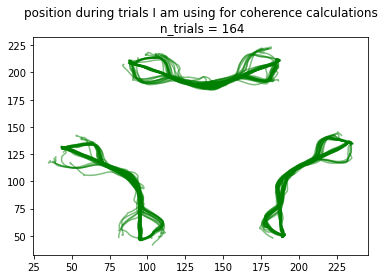

In [25]:
times = stay_trial_seg_switch_times
for ix in range(0,len(times)): 
    time_start = times.iloc[ix]-1.5
    time_end = times.iloc[ix]+1.5
    x_pos,y_pos = get_pos_timestamp(time_start,time_end,position_info)
    plt.plot(x_pos,y_pos, color= 'g',alpha=.5)
plt.title(f'position during trials I am using for coherence calculations\n n_trials = {len(times)}')

In [138]:
 stay_trial_seg_switch_times[0:20]

1     1.604078e+09
3     1.604078e+09
4     1.604078e+09
5     1.604078e+09
6     1.604078e+09
7     1.604078e+09
9     1.604078e+09
11    1.604078e+09
12    1.604078e+09
14    1.604078e+09
15    1.604078e+09
16    1.604078e+09
17    1.604078e+09
18    0.000000e+00
19    1.604078e+09
20    1.604078e+09
21    1.604078e+09
22    1.604078e+09
23    1.604078e+09
24    1.604078e+09
Name: seg_switch_times, dtype: float64

In [26]:
lfp_timestamps, lfp_data, lfp_eseries = get_timestamps_and_data(nwb_file_name,data_type = ['lfp'])
# raw_timestamps, raw_data, raw_eseries = get_timestamps_and_data(nwb_file_name,data_type = ['raw'])

theta_timestamps, theta_data, theta_eseries = get_timestamps_and_data(nwb_file_name,filter_type=['Theta 5-11 Hz'],data_type = ['theta'])

In [160]:
keeping_speed[ix-1]

[time
 1.604079e+09     6.672742
 1.604079e+09     8.228016
 1.604079e+09     9.877999
 1.604079e+09    11.764348
 1.604079e+09    14.051926
                   ...    
 1.604079e+09    23.363489
 1.604079e+09    17.019885
 1.604079e+09    11.367274
 1.604079e+09     6.399538
 1.604079e+09     2.221988
 Name: head_speed, Length: 76, dtype: float64]

In [27]:
electrode_id = np.sort((Electrode() & {'nwb_file_name':nwb_file_name}).fetch('electrode_id'))

In [28]:
electrode_id = np.sort((Electrode() & {'nwb_file_name':nwb_file_name}).fetch('electrode_id'))
lfp_electrode_ids =get_electrode_ids(nwb_file_name, which_elects =4, ref=True)

#remove permanently dead tetrode channels. (the ones above tet 24).
lfp_electrode_ids = remove_dead_tet_chans(nwb_file_name, lfp_electrode_ids, perm_dead_chan=96)
lfp_electrode_ids

check_for_dead_probes(nwb_file_name, lfp_electrode_ids)

#look at dead tetrodes that actually could have existed, make sure another electrode from the tet is represented
#If the dead channel is not in our list of electrodes, print none. 
#in testing, none of dead ones were the first in the electrode group, so need to test with a working case when i need it. 
lfp_electrode_ids = checking_other_dead_tets(nwb_file_name,lfp_electrode_ids)
electrode_id = [8,17,40,132,244,300]



original electrode ids, minus ref = [  0   4  40  44  48  52  56  60  64  68  72  76   8  80  84  88  92  96
 100 104 108 112 116  12 120 124 128 132 136 140 144 148 152 156 160 164
 168 172 176 180 184 188 192 196 200 204 208 212 216 220 224 228 232 236
 240 244 248 252 256 260 264 268 272 276 280 284 288 292 296 300 304 308
 312 316 320 324 328 332 336 340 344 348 352 356 360 364 368 372 376 380
  16  20  24  28  32  36]
added references = [ 17  48  64 288]
lfp electrode ids, plus references = [  0   4   8  12  16  17  20  24  28  32  36  40  44  48  52  56  60  64
  68  72  76  80  84  88  92  96 100 104 108 112 116 120 124 128 132 136
 140 144 148 152 156 160 164 168 172 176 180 184 188 192 196 200 204 208
 212 216 220 224 228 232 236 240 244 248 252 256 260 264 268 272 276 280
 284 288 292 296 300 304 308 312 316 320 324 328 332 336 340 344 348 352
 356 360 364 368 372 376 380]
removing [ 96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111 112 113
 114 115 116 117 118 1

In [421]:
lfp_electrode_ids

array([  0,   4,   8,  12,  16,  17,  20,  24,  28,  32,  36,  40,  44,
        48,  52,  56,  60,  64,  68,  72,  76,  80,  84,  88,  92, 128,
       132, 136, 140, 144, 148, 152, 156, 160, 164, 168, 172, 176, 180,
       184, 188, 192, 196, 200, 204, 208, 212, 216, 220, 224, 228, 232,
       236, 240, 244, 248, 252, 256, 260, 264, 268, 272, 276, 280, 284,
       288, 292, 296, 300, 304, 308, 312, 316, 320, 324, 328, 332, 336,
       340, 344, 348, 352, 356, 360, 364, 368, 372, 376, 380])

In [ ]:
num_secs_to_get = int(trial_data_sesh.iloc[-1].poke_out_ts - trial_data_sesh.iloc[0].poke_in_ts-1)

electrode_id = [8,17,40,132,244,300]
time_from_start = 0 #in seconds
time_interval_s = num_secs_to_get
sampling_rate_lfp = 1000
sampling_rate_raw = 30000


epoch = (IntervalList & {'nwb_file_name':nwb_file_name} & {'interval_list_name':'02_r1'}).fetch1('valid_times')
# x_elect_lfp, y_elect_lfp = get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, lfp_eseries, lfp_timestamps, lfp_data)
# x_elect_theta, y_elect_theta = get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, theta_eseries, theta_timestamps, theta_data)
# x_elect_raw, y_elect_raw= get_x_y_list(time_from_start, time_interval_s,epoch, electrode_id, raw_eseries, raw_timestamps, raw_data)
x_elect_lfp, y_elect_lfp = get_x_y_list(time_from_start, time_interval_s,epoch, lfp_electrode_ids, lfp_eseries, lfp_timestamps, lfp_data)
x_elect_theta, y_elect_theta = get_x_y_list(time_from_start, time_interval_s,epoch, lfp_electrode_ids, theta_eseries, theta_timestamps, theta_data)

In [484]:
electrode_id = [8,17,40,132,244,300]



In [191]:
times

1      1.604078e+09
3      1.604078e+09
4      1.604078e+09
5      1.604078e+09
6      1.604078e+09
           ...     
175    1.604079e+09
176    1.604079e+09
177    1.604079e+09
178    1.604079e+09
179    1.604079e+09
Name: seg_switch_times, Length: 164, dtype: float64

In [ ]:
times1=[]
for ix in range(len(times)):
    time=times.iloc[ix]
    if time != 0:
        times1.append(time)

In [478]:
times1[0]-1.5

1604078258.1768906

In [494]:
electrode_id = [8,17,40,132,244,300]



In [522]:
sampling_rate = sampling_rate_lfp
num_sec = 2.5
n_trials = len(times1)
n_signals= 2
n_time_samples = (num_sec*sampling_rate)

# inititalize "signal" which will contain alllll of trials of the data 
signal = np.zeros((int(n_time_samples), n_trials, n_signals))
signal_theta = np.zeros((int(n_time_samples), n_trials, n_signals))

#electrode indicces 
electrode_ix1 = 0
electrode_ix2 = 4

#these variable will hold each trials speed data  
keeping_speed = []


for ix in range(len(times1)): 
    #because the switch trials have 0 instead of a seg switch time.. so if it doesnt, grab the data for the trial,
    if times1[ix] != 0.0:
        #these +- times are hard coded for now, can change how much time around each segment time you want to look at
        time_start =times1[ix]-1.5
        time_end = times1[ix]+1
        # these functions will take the times and the eseries etc and will mask them and return the data for all electrodes in electrode id
        #also get the speed data using same methods, will append to keeping speed for later use  
        x_elect_theta_eg1, y_elect_theta_eg1 = get_x_y_timestamp_list(time_start, time_end, electrode_id, theta_eseries, theta_timestamps, theta_data)
        x_elect_lfp_eg1, y_elect_lfp_eg1 = get_x_y_timestamp_list(time_start, time_end, electrode_id, lfp_eseries, lfp_timestamps, lfp_data)
        x_speed, y_speed = get_speed_timestamp(time_start,time_end,position_info)
        keeping_speed.append([y_speed])
        
        #this is because some of the trials are missing one sample. so if they are, i append a 0. 
        #This is probably not the best way to do this, and I want to investigate why this is happening. 
        if len(y_elect_theta_eg1[0]) != n_time_samples:
            y_elect_theta_eg1[electrode_ix1] = np.pad(y_elect_theta_eg1[electrode_ix1], (0, 1), 'constant')
            y_elect_theta_eg1[electrode_ix2] = np.pad(y_elect_theta_eg1[electrode_ix2], (0, 1), 'constant')

            y_elect_lfp_eg1[electrode_ix1] = np.pad(y_elect_lfp_eg1[electrode_ix1], (0, 1), 'constant')
            y_elect_lfp_eg1[electrode_ix2] = np.pad(y_elect_lfp_eg1[electrode_ix2], (0, 1), 'constant')

        #signal theta has the theta filtered data for each trial, just to plot later
        signal_theta[:,ix,0] = (y_elect_theta_eg1[electrode_ix1])
        signal_theta[:,ix,1]= (y_elect_theta_eg1[electrode_ix2])
        # signal has the lfp filtered data to pass into multitaper analysis 
        signal[:,ix,0] = (y_elect_lfp_eg1[electrode_ix1])
        signal[:,ix,1]= (y_elect_lfp_eg1[electrode_ix2])
        


In [530]:
time_start =times1[ix]-1.5
time_end = times1[ix]+1
x_elect_lfp_eg1, y_elect_lfp_eg1 = get_x_y_timestamp_list(time_start, time_end, electrode_id, lfp_eseries, lfp_timestamps, lfp_data)



In [531]:
type(time_start)

numpy.float64

In [523]:
lfp_timestamps

<HDF5 dataset "timestamps": shape (23870420,), type "<f8">

In [497]:
lfp_timestamps
time_start

1604079391.665564

In [331]:
x= [i for i in np.arange(-1.25,1,0.5)]

In [332]:
x

[-1.25, -0.75, -0.25, 0.25, 0.75]

In [293]:
print(signal.shape)
print(len(keeping_speed))

(3000, 152, 2)
152


In [190]:
len(y_elect_theta_eg1[electrode_ix1])

2500

In [219]:
from coherence import multitaper_and_connectivity

TypeError: multitaper_and_connectivity() missing 1 required positional argument: 'start_time'

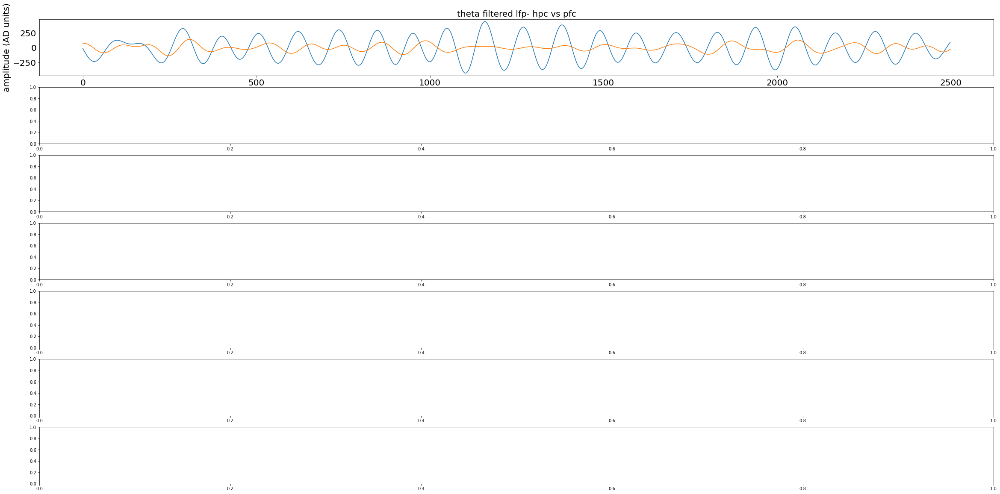

<Figure size 1440x72 with 0 Axes>

In [424]:
electrode_ix1 = 0
electrode_ix2 = 4
n_trials = 1
n_signals = 2
coher_keeper = []
hpc_power_keeper=[]
pfc_power_keeper=[]
start_time = (-1*1.5)
for ix in range(len(signal[1,:])):
        #get signal, single trial worth of data
    signal_trial = np.zeros((int(n_time_samples), n_trials, n_signals))
    sig_trial_hpc =  signal[:,ix,0]
    sig_trial_pfc =  signal[:,ix,1]
        #get trial for theta band to plot lfp
    signal_trial_theta = np.zeros((int(n_time_samples), n_trials, n_signals))
    sig_trial_hpc_theta =  signal_theta[:,ix,0]
    sig_trial_pfc_theta =  signal_theta[:,ix,1]
        #make a new signal structure to pass into multitaper, just the two trials 
    n_time_samples = len(sig_trial_hpc)
    signal_trial[:,0,0]=sig_trial_hpc 
    signal_trial[:,0,1]=sig_trial_pfc 


    fig, axes = plt.subplots(nrows=7, ncols=1, figsize=(40,20))
        #plot theta band
    plt.figure(figsize = (20,1))
    axes[0].plot(sig_trial_hpc_theta)
    axes[0].plot(sig_trial_pfc_theta)
    axes[0].set_ylabel('amplitude (AD units)',fontsize=20)
    axes[0].set_title('theta filtered lfp- hpc vs pfc',fontsize=20)
    axes[0].tick_params(axis='both', which='major', labelsize=20)
    axes[0].tick_params(axis='both', which='minor', labelsize=20)

    # do the multiptaper/conenctivity 
    sampling_frequency=1000
    time_halfbandwidth_product=1.5
    time_window_duration=.5
    time_window_step=None

    time, freq, mag, power, n_trials = multitaper_and_connectivity(sig_trial_hpc,sampling_frequency,time_halfbandwidth_product,time_window_duration,time_window_step)

    

    mesh = axes[1].pcolormesh(x, freq[0], power().squeeze().T,
                                cmap='viridis')
    cb = fig.colorbar(mesh, orientation='horizontal',
                      shrink=.5, aspect=15, pad=0.1, label='Power')
    cb.outline.set_linewidth(0)
    axes[1].set_ylim(0,20)
    axes[1].set_ylabel('Frequency [Hz]',fontsize=20)
    axes[1].set_xlabel('Time [sec]',fontsize=20)
    axes[1].set_title(f'power electrode {electrode_id[electrode_ix1]}- hpc',fontsize=20)
    axes[1].tick_params(axis='both', which='major', labelsize=20)
    axes[1].tick_params(axis='both', which='minor', labelsize=20)

    power_8hz=  power().squeeze().T[(freq[0] == 8)][0]
    hpc_power_keeper.append(power_8hz)
    axes[2].plot(x,power_8hz)
    axes[2].set_ylabel('power',fontsize=20)
    axes[2].set_xlabel('Time [sec]',fontsize=20)
    axes[2].set_title(f'power electrode {electrode_id[electrode_ix1]}-hpc- 8hz',fontsize=20)
    axes[2].tick_params(axis='both', which='major', labelsize=20)
    axes[2].tick_params(axis='both', which='minor', labelsize=20)

    time, freq, mag, power,n_trials = multitaper_and_connectivity(sig_trial_pfc,sampling_frequency,time_halfbandwidth_product,time_window_duration,time_window_step)


    mesh = axes[3].pcolormesh(x, freq[0], power().squeeze().T,
                                cmap='viridis')
    cb = fig.colorbar(mesh, orientation='horizontal',
                      shrink=.5, aspect=15, pad=0.1, label='Power')
    cb.outline.set_linewidth(0)
    axes[3].set_ylim(0,20)
    axes[3].set_ylabel('Frequency [Hz]',fontsize=20)
    axes[3].set_xlabel('Time [sec]',fontsize=20)
    axes[3].set_title(f'power electrode {electrode_id[electrode_ix1]}- pfc',fontsize=20)
    axes[3].tick_params(axis='both', which='major', labelsize=20)
    axes[3].tick_params(axis='both', which='minor', labelsize=20)

    power_8hz=  power().squeeze().T[(freq[0] == 8)][0]
    pfc_power_keeper.append(power_8hz)
    axes[4].plot(x,power_8hz)
    axes[4].set_ylabel('power',fontsize=20)
    axes[4].set_xlabel('Time [sec]',fontsize=20)
    axes[4].set_title(f'power electrode {electrode_id[electrode_ix1]}-pfc- 8hz',fontsize=20)
    axes[4].tick_params(axis='both', which='major', labelsize=20)
    axes[4].tick_params(axis='both', which='minor', labelsize=20)



    time, freq, mag, power,n_trials = multitaper_and_connectivity(signal_trial,sampling_frequency,time_halfbandwidth_product,time_window_duration,time_window_step)



    freq_seg = freq[0][(freq[0] == 8)]
    coh_seg = mag()[..., 0, 1].squeeze().T[(freq[0] == 8)]
    coher_keeper.append(coh_seg[0])

    # plt.figure(figsize=(20,1))
    axes[5].plot(x,coh_seg[0])
    axes[5].set_title('coherence at 8hz',fontsize=20)
    axes[5].set_ylabel('coherence',fontsize=20)
    axes[5].tick_params(axis='both', which='major', labelsize=20)
    axes[5].tick_params(axis='both', which='minor', labelsize=20)

    axes[6].plot(keeping_speed[ix][0])
    axes[6].set_ylabel('speed (cm/s)',fontsize=20)
    axes[6].tick_params(axis='both', which='major', labelsize=20)
    axes[6].tick_params(axis='both', which='minor', labelsize=20)
    plt.tight_layout()




In [372]:
concat_pfc = np.concatenate(pfc_power_keeper)
concat_hpc = np.concatenate(hpc_power_keeper)

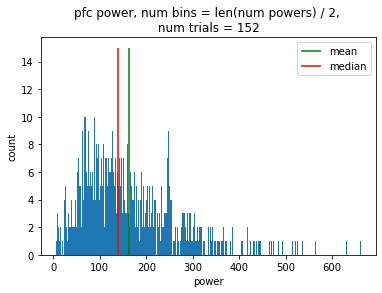

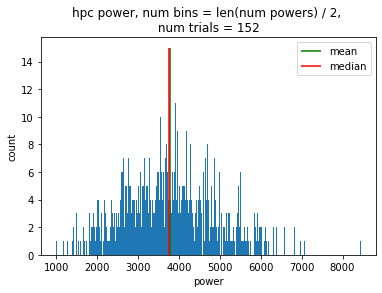

In [382]:

plt.figure()
plt.hist(concat_pfc, bins=int(len(concat_pfc)/2))
plt.title(f'pfc power, num bins = len(num powers) / 2, \n num trials = {m.n_trials} ')
plt.xlabel('power')
plt.ylabel('count')
plt.vlines(statistics.mean(concat_pfc),0,15,color='g',label='mean')
plt.vlines(statistics.median(concat_pfc),0,15,color='r',label='median')
plt.legend()

plt.figure()
plt.hist(concat_hpc, bins=int(len(concat_hpc)/2))
plt.title(f'hpc power, num bins = len(num powers) / 2, \n num trials = {m.n_trials} ')
plt.xlabel('power')
plt.ylabel('count')
plt.vlines(statistics.mean(concat_hpc),0,15,color='g',label='mean')
plt.vlines(statistics.median(concat_hpc),0,15,color='r',label='median')
plt.legend()

(0.0, 400.0)

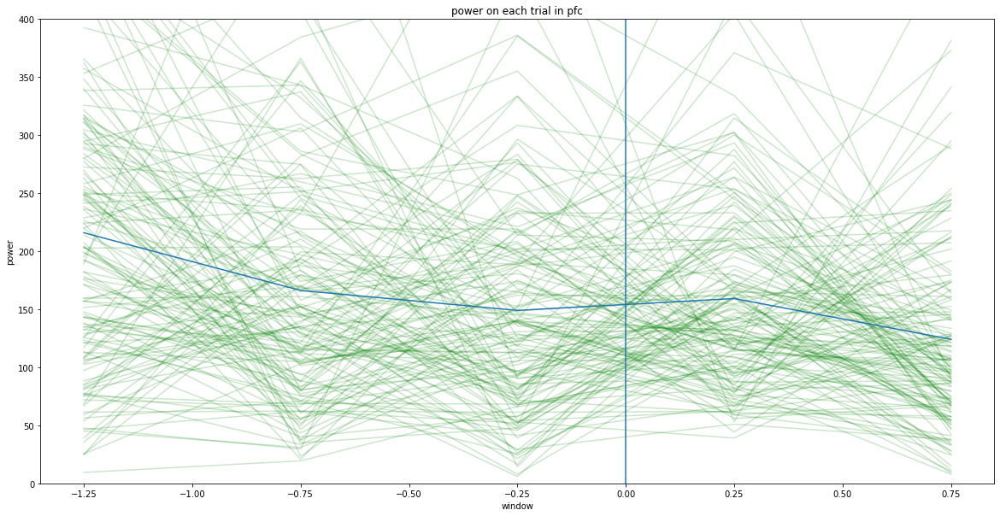

In [341]:
plt.figure(figsize=(20,10))
for ix in range(len(pfc_power_keeper)):
    plt.plot(x,pfc_power_keeper[ix],color='g',alpha=.2)
a=np.array(pfc_power_keeper)
# x = np.delete(a, (23), axis=0)
plt.plot(x,np.mean(a, axis=0))
plt.title('power on each trial in pfc')
plt.vlines(0,0,400)
plt.xlabel('window')
plt.ylabel('power')
plt.ylim(0,400)

Text(0, 0.5, 'power')

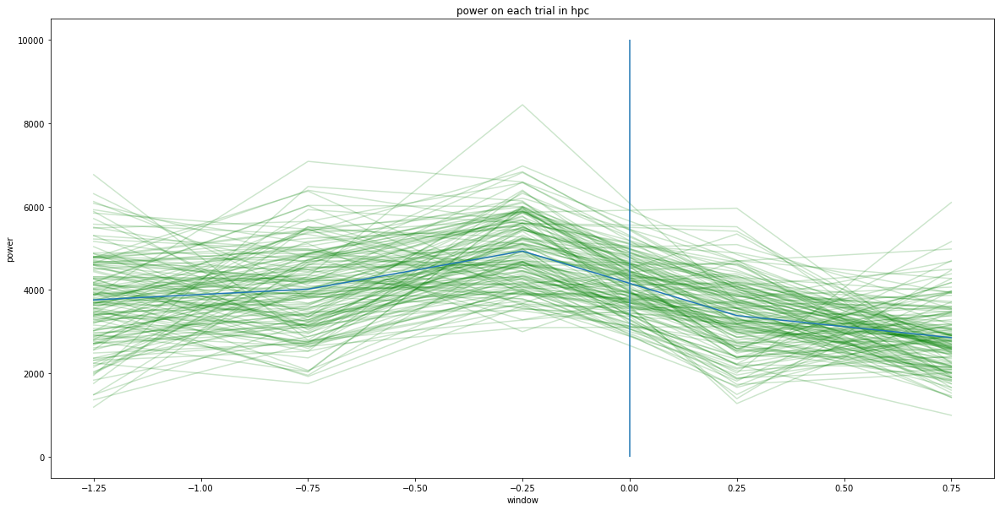

In [344]:
plt.figure(figsize=(20,10))
for ix in range(len(hpc_power_keeper)):
    plt.plot(x,hpc_power_keeper[ix],color='g',alpha=.2)
a=np.array(hpc_power_keeper)
# x = np.delete(a, (23), axis=0)
plt.plot(x,np.mean(a, axis=0))
plt.title('power on each trial in hpc')
plt.vlines(0,0,10000)
plt.xlabel('window')
plt.ylabel('power')

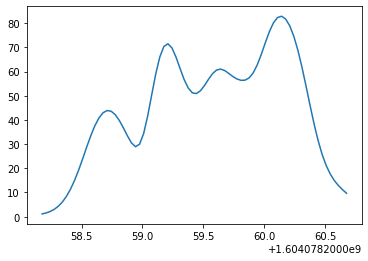

In [ ]:
# from coherence import plot_something
# fig, (ax1) = plt.subplots(1)
# # plot_something(data1, ax1, color='blue')
# plot_something(keeping_speed[0],ax1,)

In [245]:
keeping_speed[0]

[time
 1.604078e+09     1.141550
 1.604078e+09     1.555761
 1.604078e+09     2.166461
 1.604078e+09     3.063466
 1.604078e+09     4.346456
                   ...    
 1.604078e+09    17.596574
 1.604078e+09    14.939608
 1.604078e+09    12.873218
 1.604078e+09    11.181008
 1.604078e+09     9.680281
 Name: head_speed, Length: 76, dtype: float64]

In [236]:
time
freq[0]

array([  0.,   2.,   4.,   6.,   8.,  10.,  12.,  14.,  16.,  18.,  20.,
        22.,  24.,  26.,  28.,  30.,  32.,  34.,  36.,  38.,  40.,  42.,
        44.,  46.,  48.,  50.,  52.,  54.,  56.,  58.,  60.,  62.,  64.,
        66.,  68.,  70.,  72.,  74.,  76.,  78.,  80.,  82.,  84.,  86.,
        88.,  90.,  92.,  94.,  96.,  98., 100., 102., 104., 106., 108.,
       110., 112., 114., 116., 118., 120., 122., 124., 126., 128., 130.,
       132., 134., 136., 138., 140., 142., 144., 146., 148., 150., 152.,
       154., 156., 158., 160., 162., 164., 166., 168., 170., 172., 174.,
       176., 178., 180., 182., 184., 186., 188., 190., 192., 194., 196.,
       198., 200., 202., 204., 206., 208., 210., 212., 214., 216., 218.,
       220., 222., 224., 226., 228., 230., 232., 234., 236., 238., 240.,
       242., 244., 246., 248., 250., 252., 254., 256., 258., 260., 262.,
       264., 266., 268., 270., 272., 274., 276., 278., 280., 282., 284.,
       286., 288., 290., 292., 294., 296., 298., 30

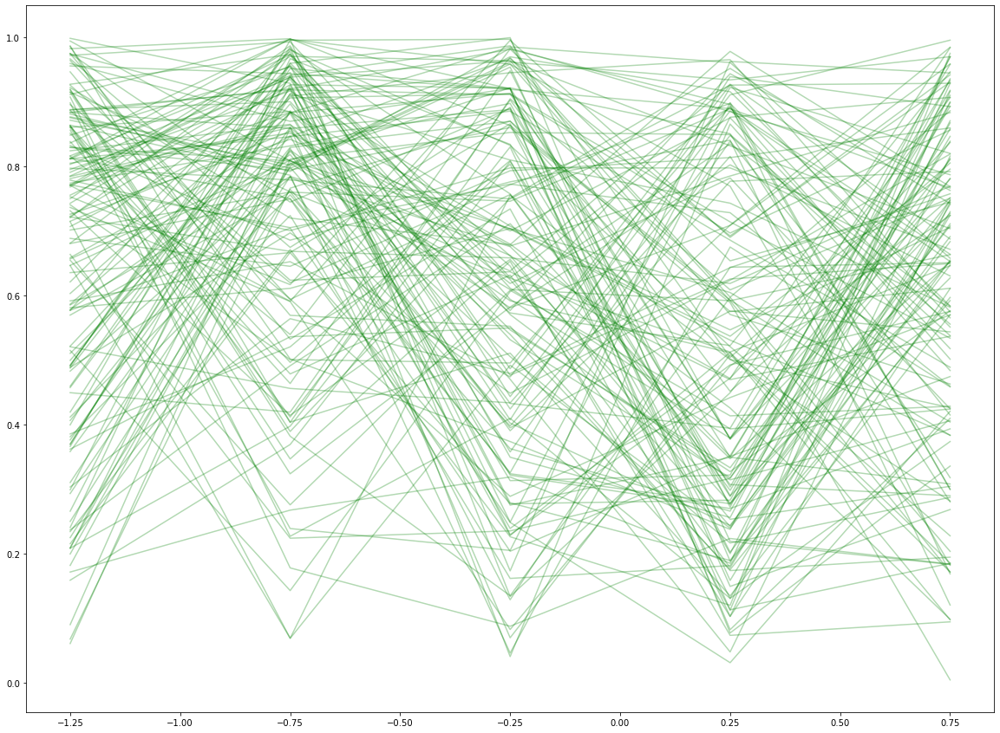

In [345]:
plt.figure(figsize=(20,15))
for ix in range(len(coher_keeper)):
    coh_single = coher_keeper[ix]
    plt.plot(x,coh_single,color='g',alpha=.3)

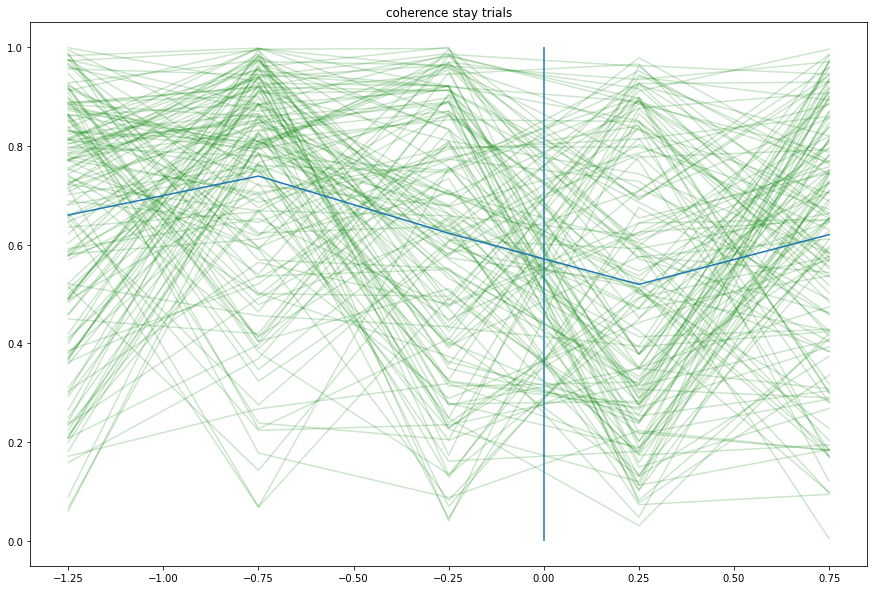

In [347]:
plt.figure(figsize=(15,10))
for ix in range(len(coher_keeper)):
    plt.plot(x,coher_keeper[ix],color='g',alpha=.2)
a=np.array(coher_keeper)
# x = np.delete(a, (23), axis=0)
plt.plot(x,np.mean(a, axis=0))
plt.title('coherence stay trials')
plt.vlines(0,0,1)

In [349]:
import statistics
electrode_ix1 = 0
electrode_ix2 = 4
n_trials = 1
n_signals = 2
trial_tracker=[]


for ix in range(len(signal[1,:])):
    signal_trial = np.zeros((int(n_time_samples), n_trials, n_signals))
    sig_trial_hpc =  signal[:,ix,0]
    sig_trial_pfc =  signal[:,ix,1]
    
    # n_time_samples = len(sig_trial_hpc)
    # signal_trial[:,0,0]=sig_trial_hpc 
    # signal_trial[:,0,1]=sig_trial_pfc 
    
    sampling_frequency=1000
    time_halfbandwidth_product=1.5
    time_window_duration=.5
    time_window_step=None
    
    time, freq, mag, power,n_trials = multitaper_and_connectivity(sig_trial_pfc ,sampling_frequency,time_halfbandwidth_product,time_window_duration,time_window_step)

    power_series_trial = power().squeeze().T[(freq[0] == 8)][0]
    if sum(power_series_trial<100) >round(len(power_series_trial)*.25):
        trial_tracker.append(ix)
    

In [350]:
len(trial_tracker)

74

In [ ]:
electrode_ix1 = 0
electrode_ix2 = 4
n_trials = 1
n_signals = 2
coher_keeper = []
hpc_power_keeper = []
pfc_power_keeper = []

for ix in range(len(signal[1,:])):
    if ix not in trial_tracker:
        #get signal, single trial worth of data
        signal_trial = np.zeros((int(n_time_samples), n_trials, n_signals))
        sig_trial_hpc =  signal[:,ix,0]
        sig_trial_pfc =  signal[:,ix,1]
        #get trial for theta band to plot lfp
        signal_trial_theta = np.zeros((int(n_time_samples), n_trials, n_signals))
        sig_trial_hpc_theta =  signal_theta[:,ix,0]
        sig_trial_pfc_theta =  signal_theta[:,ix,1]
        #make a new signal structure to pass into multitaper, just the two trials 
        n_time_samples = len(sig_trial_hpc)
        signal_trial[:,0,0]=sig_trial_hpc 
        signal_trial[:,0,1]=sig_trial_pfc 


        fig, axes = plt.subplots(nrows=7, ncols=1, figsize=(40,20))
        #plot theta band
        plt.figure(figsize = (20,1))
        axes[0].plot(sig_trial_hpc_theta)
        axes[0].plot(sig_trial_pfc_theta)
        axes[0].set_ylabel('amplitude (AD units)',fontsize=20)
        axes[0].set_title('theta filtered lfp- hpc vs pfc',fontsize=20)
        axes[0].tick_params(axis='both', which='major', labelsize=20)
        axes[0].tick_params(axis='both', which='minor', labelsize=20)

        # do the multiptaper/conenctivity 
        sampling_frequency=1000
        time_halfbandwidth_product=1.5
        time_window_duration=.5
        time_window_step=None

        time, freq, mag, power,n_trials = multitaper_and_connectivity(sig_trial_hpc,sampling_frequency,time_halfbandwidth_product,time_window_duration,time_window_step)


        mesh = axes[1].pcolormesh(time, freq[0], power().squeeze().T,
                                    cmap='viridis')
        cb = fig.colorbar(mesh, orientation='horizontal',
                          shrink=.5, aspect=15, pad=0.1, label='Power')
        cb.outline.set_linewidth(0)
        axes[1].set_ylim(0,20)
        axes[1].set_ylabel('Frequency [Hz]',fontsize=20)
        axes[1].set_xlabel('Time [sec]',fontsize=20)
        axes[1].set_title(f'power electrode {electrode_id[electrode_ix1]}- hpc',fontsize=20)
        axes[1].tick_params(axis='both', which='major', labelsize=20)
        axes[1].tick_params(axis='both', which='minor', labelsize=20)
        
        power_8hz=  power().squeeze().T[(freq[0] == 8)][0]
        axes[2].plot(x,power_8hz)
        hpc_power_keeper.append(power_8hz)
        axes[2].set_ylabel('power',fontsize=20)
        axes[2].set_xlabel('Time [sec]',fontsize=20)
        axes[2].set_title(f'power electrode {electrode_id[electrode_ix1]}-hpc- 8hz',fontsize=20)
        axes[2].tick_params(axis='both', which='major', labelsize=20)
        axes[2].tick_params(axis='both', which='minor', labelsize=20)

        
        time, freq, mag, power,n_trials = multitaper_and_connectivity(sig_trial_pfc,sampling_frequency,time_halfbandwidth_product,time_window_duration,time_window_step)


        mesh = axes[3].pcolormesh(x, freq[0], power().squeeze().T,
                                    cmap='viridis')
        cb = fig.colorbar(mesh, orientation='horizontal',
                          shrink=.5, aspect=15, pad=0.1, label='Power')
        cb.outline.set_linewidth(0)
        axes[3].set_ylim(0,20)
        axes[3].set_ylabel('Frequency [Hz]',fontsize=20)
        axes[3].set_xlabel('Time [sec]',fontsize=20)
        axes[3].set_title(f'power electrode {electrode_id[electrode_ix1]}- pfc',fontsize=20)
        axes[3].tick_params(axis='both', which='major', labelsize=20)
        axes[3].tick_params(axis='both', which='minor', labelsize=20)
        
        power_8hz=  power().squeeze().T[(freq[0] == 8)][0]
        axes[4].plot(x,power_8hz)
        pfc_power_keeper.append(power_8hz)


        axes[4].set_ylabel('power',fontsize=20)
        axes[4].set_xlabel('Time [sec]',fontsize=20)
        axes[4].set_title(f'power electrode {electrode_id[electrode_ix1]}-pfc- 8hz',fontsize=20)
        axes[4].tick_params(axis='both', which='major', labelsize=20)
        axes[4].tick_params(axis='both', which='minor', labelsize=20)



        time, freq, mag, power,n_trials = multitaper_and_connectivity(signal_trial,sampling_frequency,time_halfbandwidth_product,time_window_duration,time_window_step)


        freq_seg = freq[0][(freq[0] == 8)]
        coh_seg = mag()[..., 0, 1].squeeze().T[(freq[0] == 8)]
        coher_keeper.append(coh_seg[0])
                                 
        # plt.figure(figsize=(20,1))
        axes[5].plot(x,coh_seg[0])
        axes[5].set_title('coherence at 8hz',fontsize=20)
        axes[5].set_ylabel('coherence',fontsize=20)
        axes[5].tick_params(axis='both', which='major', labelsize=20)
        axes[5].tick_params(axis='both', which='minor', labelsize=20)
        
        axes[6].plot(keeping_speed[ix][0])
        axes[6].set_ylabel('speed (cm/s)',fontsize=20)
        axes[6].tick_params(axis='both', which='major', labelsize=20)
        axes[6].tick_params(axis='both', which='minor', labelsize=20)
        plt.tight_layout()





Text(0, 0.5, 'power')

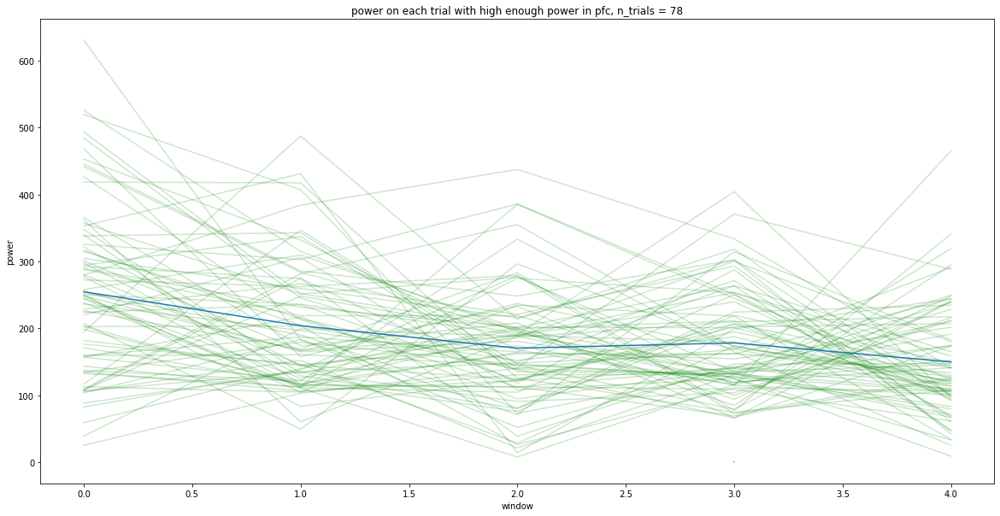

In [352]:
plt.figure(figsize=(20,10))
for ix in range(len(pfc_power_keeper)):
    plt.plot(pfc_power_keeper[ix],color='g',alpha=.2)
a=np.array(pfc_power_keeper)
# x = np.delete(a, (23), axis=0)
plt.plot(np.mean(a, axis=0))
plt.title(f'power on each trial with high enough power in pfc, n_trials = {len(pfc_power_keeper)}')
plt.vlines(1.5*2,0,1)
plt.xlabel('window')
plt.ylabel('power')

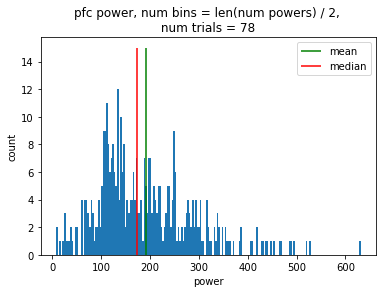

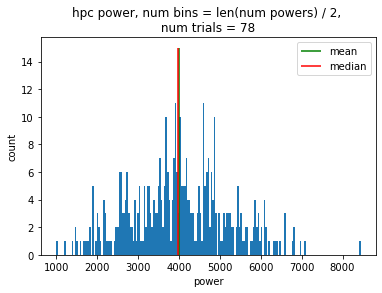

In [385]:
concat_pfc = np.concatenate(pfc_power_keeper)
concat_hpc = np.concatenate(hpc_power_keeper)

plt.figure()
plt.hist(concat_pfc, bins=int(len(concat_pfc)/2))
plt.title(f'pfc power, num bins = len(num powers) / 2, \n num trials = {len(pfc_power_keeper)} ')
plt.xlabel('power')
plt.ylabel('count')
plt.vlines(statistics.mean(concat_pfc),0,15,color='g',label='mean')
plt.vlines(statistics.median(concat_pfc),0,15,color='r',label='median')
plt.legend()

plt.figure()
plt.hist(concat_hpc, bins=int(len(concat_hpc)/2))
plt.title(f'hpc power, num bins = len(num powers) / 2, \n num trials = {len(hpc_power_keeper)} ')
plt.xlabel('power')
plt.ylabel('count')
plt.vlines(statistics.mean(concat_hpc),0,15,color='g',label='mean')
plt.vlines(statistics.median(concat_hpc),0,15,color='r',label='median')
plt.legend()

Text(0, 0.5, 'power')

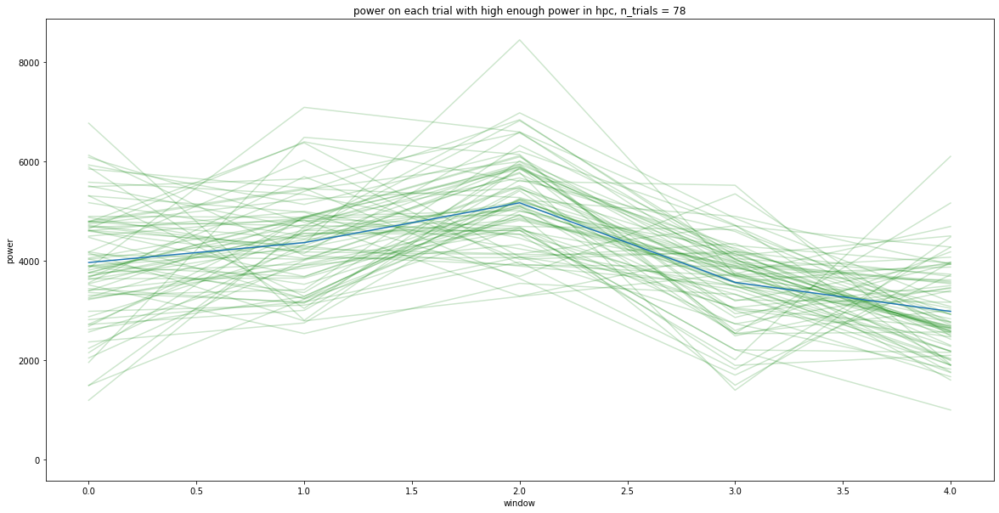

In [353]:
plt.figure(figsize=(20,10))
for ix in range(len(pfc_power_keeper)):
    plt.plot(hpc_power_keeper[ix],color='g',alpha=.2)
a=np.array(hpc_power_keeper)
# x = np.delete(a, (23), axis=0)
plt.plot(np.mean(a, axis=0))
plt.title(f'power on each trial with high enough power in hpc, n_trials = {len(hpc_power_keeper)}')
plt.vlines(1.5*2,0,1)
plt.xlabel('window')
plt.ylabel('power')

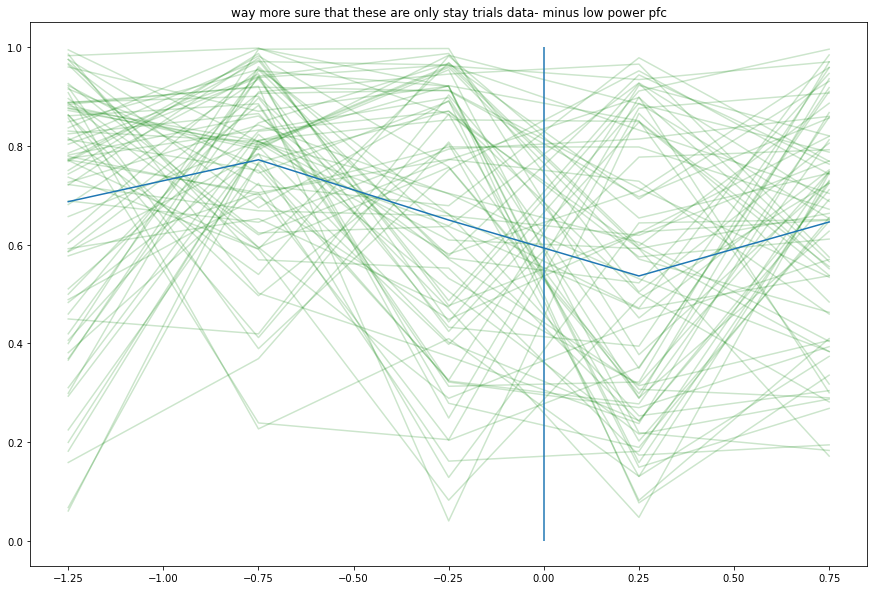

In [355]:
plt.figure(figsize=(15,10))
for ix in range(len(coher_keeper)):
    plt.plot(x,coher_keeper[ix],color='g',alpha=.2)
a=np.array(coher_keeper)
# x = np.delete(a, (23), axis=0)
plt.plot(x,np.mean(a, axis=0))
plt.title('way more sure that these are only stay trials data- minus low power pfc')
plt.vlines(0,0,1)

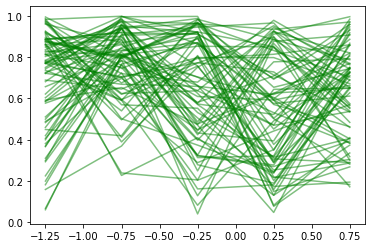

In [357]:
for ix in range(len(coher_keeper)):
    plt.plot(x,coher_keeper[ix],color='g',alpha=.5)

frequency resolution: 6.0


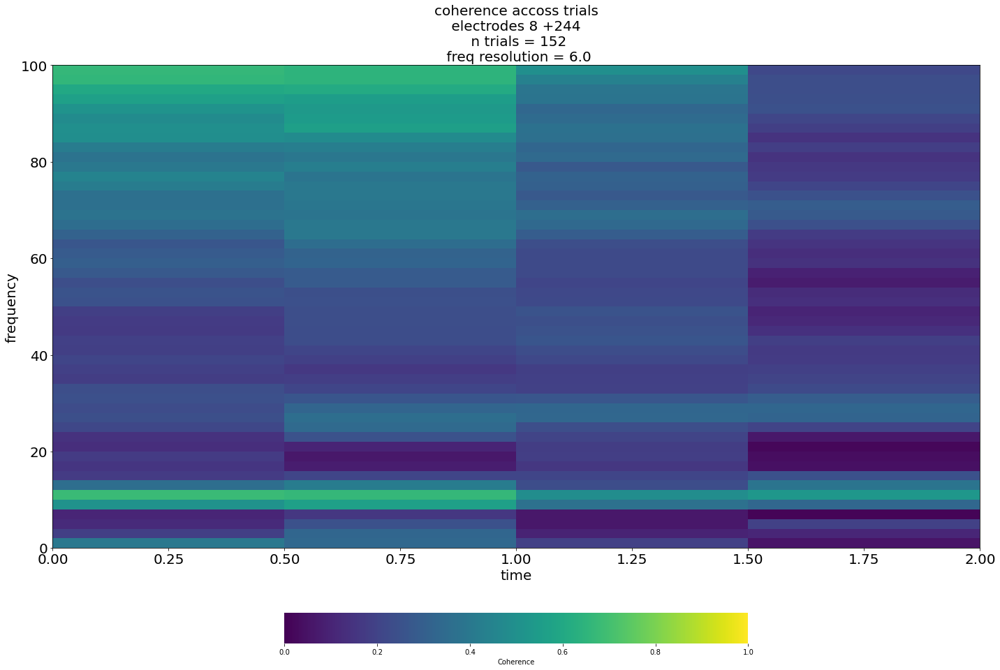

In [359]:
sampling_frequency=1000
time_halfbandwidth_product=1.5
time_window_duration=.5
time_window_step=None


m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               time_window_duration=time_window_duration,
               time_window_step=time_window_step)
               # start_time=time_data[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies,
                 time=m.time)
time_grid, freq_grid = np.meshgrid(
    np.append(c.time, c.time[-1]),
    np.append(c.frequencies, m.nyquist_frequency))

plt.figure(figsize=(20,15))
mesh = plt.pcolormesh(time_grid,freq_grid , c.coherence_magnitude()[..., 0, 1].squeeze().T,
                             vmin=0.0, vmax=1.0, cmap='viridis')
plt.ylabel('frequency',fontsize=20)
plt.xlabel('time',fontsize=20)

plt.ylim(0,100)
plt.yticks(fontsize=20)

plt.xticks(fontsize=20)

# plt.xlim(time_data[0],time_data[-1])
plt.title(f'coherence accoss trials\n electrodes {electrode_id[electrode_ix1]} +{electrode_id[electrode_ix2]} \n n trials = {m.n_trials}\n freq resolution = {m.frequency_resolution}', fontsize=20)
# plt.xlim(0,3)

plt.tight_layout()
cb = plt.colorbar(mesh, orientation='horizontal',
                  shrink=.5, aspect=15, pad=0.1, label='Coherence')
# cb = plt.colorbar(mesh, ax.ravel().tolist(), orientation='horizontal',
#                   shrink=.5, aspect=15, pad=0.1, label='Coherence')
cb.outline.set_linewidth(0)
cb.outline.set_linewidth(0)
cb.fontsize=50
print('frequency resolution: {}'.format(m.frequency_resolution))



Text(0, 0.5, 'coherence')

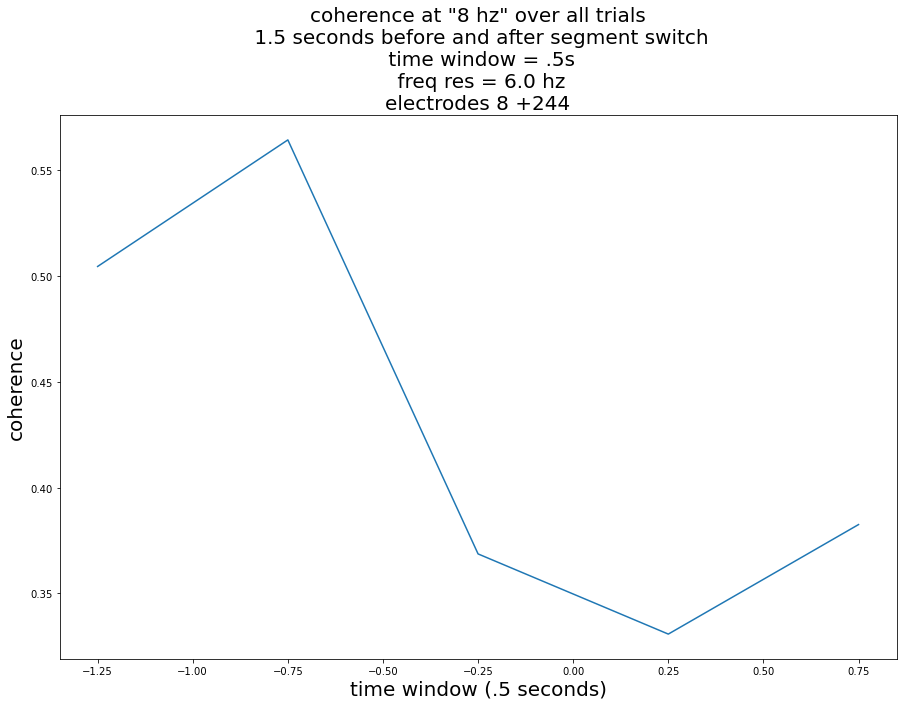

In [363]:
c.frequencies
freq_seg = c.frequencies[(c.frequencies == 8)]# & (c.frequencies <=9.5)]
coh_seg = c.coherence_magnitude()[..., 0, 1].squeeze().T[(c.frequencies == 8)]# & (c.frequencies <=9.5)]
coherency = c.coherency()[:, (c.frequencies == 8), 0, 1].squeeze()
power_pfc = c.power()[:,:,1].squeeze().T[(c.frequencies == 8)][0]
power_hpc = c.power()[:,:,0].squeeze().T[(c.frequencies == 8)][0]

coherency
plt.figure(figsize=(15,10))
plt.plot(x,coh_seg[0])
plt.title(f'coherence at "8 hz" over all trials\n 1.5 seconds before and after segment switch\n time window = .5s\n freq res = {m.frequency_resolution} hz\nelectrodes {electrode_id[electrode_ix1]} +{electrode_id[electrode_ix2]}',fontsize=20)
plt.xlabel('time window (.5 seconds)',fontsize=20)
plt.ylabel('coherence',fontsize=20)

Text(0, 0.5, 'power')

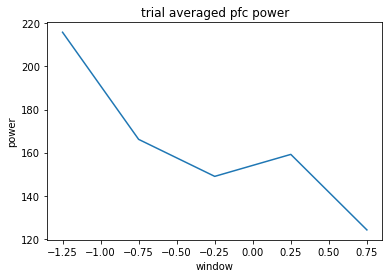

In [399]:
plt.plot(x,power_pfc)
plt.title('trial averaged pfc power')
plt.xlabel('window')
plt.ylabel('power')
# plt.plot(power_hpc)

Text(0, 0.5, 'power')

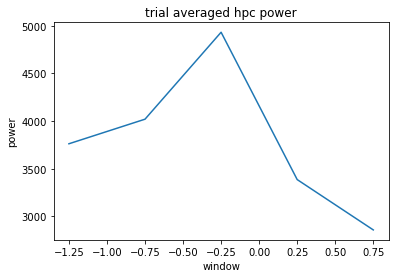

In [362]:
plt.plot(x, power_hpc)
plt.title('trial averaged hpc power')
plt.xlabel('window')
plt.ylabel('power')
# plt.plot(power_hpc)

In [ ]:
#removing low power pfc trials 

In [483]:
sampling_rate = sampling_rate_lfp
num_sec = 2.5
n_trials = len(times1)-len(trial_tracker)
n_signals= 2
n_time_samples = (num_sec*sampling_rate)

# inititalize "signal" which will contain alllll of trials of the data 
signal = np.zeros((int(n_time_samples), n_trials, n_signals))
signal_theta = np.zeros((int(n_time_samples), n_trials, n_signals))

#electrode indicces 
electrode_ix1 = 0
electrode_ix2 = 4

#these variable will hold each trials speed data  
keeping_speed = []

counter= 0
for ix in range(len(times1)): 
    #because the switch trials have 0 instead of a seg switch time.. so if it doesnt, grab the data for the trial,
    if times1[ix] != 0.0:
        if ix not in trial_tracker:
            #these +- times are hard coded for now, can change how much time around each segment time you want to look at
            time_start =times1[ix]-1.5
            time_end = times1[ix]+1
            # these functions will take the times and the eseries etc and will mask them and return the data for all electrodes in electrode id
            #also get the speed data using same methods, will append to keeping speed for later use  
            x_elect_theta_eg1, y_elect_theta_eg1 = get_x_y_timestamp_list(time_start, time_end, electrode_id, theta_eseries, theta_timestamps, theta_data)
            x_elect_lfp_eg1, y_elect_lfp_eg1 = get_x_y_timestamp_list(time_start, time_end, electrode_id, lfp_eseries, lfp_timestamps, lfp_data)
            x_speed, y_speed = get_speed_timestamp(time_start,time_end,position_info)
            keeping_speed.append([y_speed])

            #this is because some of the trials are missing one sample. so if they are, i append a 0. 
            #This is probably not the best way to do this, and I want to investigate why this is happening. 
            if len(y_elect_theta_eg1[0]) != n_time_samples:
                y_elect_theta_eg1[electrode_ix1] = np.pad(y_elect_theta_eg1[electrode_ix1], (0, 1), 'constant')
                y_elect_theta_eg1[electrode_ix2] = np.pad(y_elect_theta_eg1[electrode_ix2], (0, 1), 'constant')

                y_elect_lfp_eg1[electrode_ix1] = np.pad(y_elect_lfp_eg1[electrode_ix1], (0, 1), 'constant')
                y_elect_lfp_eg1[electrode_ix2] = np.pad(y_elect_lfp_eg1[electrode_ix2], (0, 1), 'constant')

            #signal theta has the theta filtered data for each trial, just to plot later
            signal_theta[:,counter,0] = (y_elect_theta_eg1[electrode_ix1])
            signal_theta[:,counter,1]= (y_elect_theta_eg1[electrode_ix2])
            # signal has the lfp filtered data to pass into multitaper analysis 
            signal[:,counter,0] = (y_elect_lfp_eg1[electrode_ix1])
            signal[:,counter,1]= (y_elect_lfp_eg1[electrode_ix2])
            counter=counter+1

IndexError: list index out of range

In [449]:
electrode_id

[8, 17, 40, 132, 244, 300]

frequency resolution: 6.0


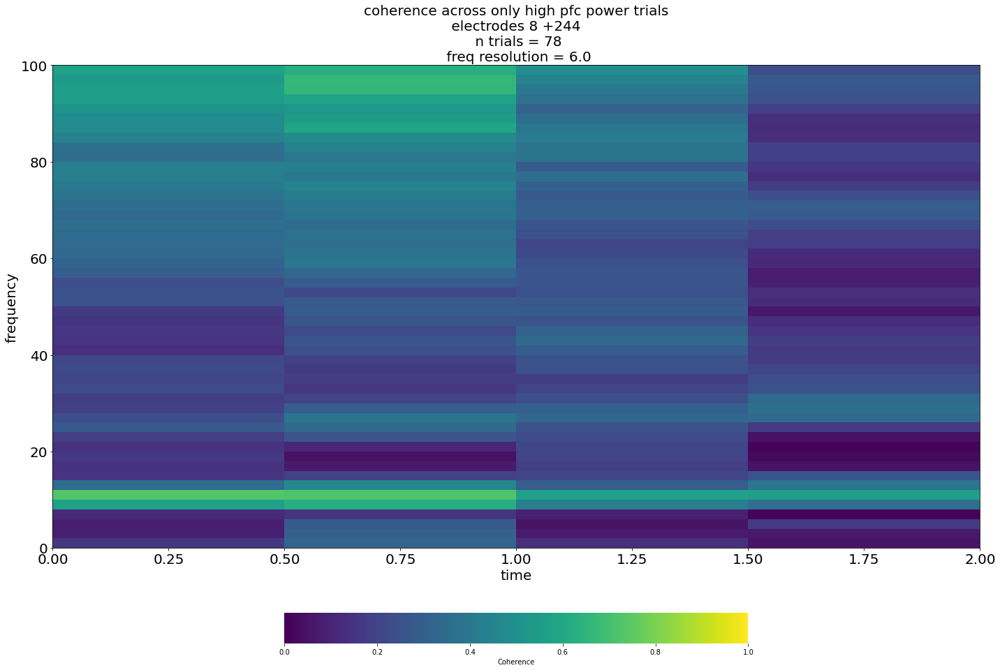

In [401]:
sampling_frequency=1000
time_halfbandwidth_product=1.5
time_window_duration=.5
time_window_step=None


m = Multitaper(signal,
               sampling_frequency=sampling_frequency,
               time_halfbandwidth_product=time_halfbandwidth_product,
               time_window_duration=time_window_duration,
               time_window_step=time_window_step)
               # start_time=time_data[0])
c = Connectivity(fourier_coefficients=m.fft(),
                 frequencies=m.frequencies,
                 time=m.time)
time_grid, freq_grid = np.meshgrid(
    np.append(c.time, c.time[-1]),
    np.append(c.frequencies, m.nyquist_frequency))

plt.figure(figsize=(20,15))
mesh = plt.pcolormesh(time_grid,freq_grid , c.coherence_magnitude()[..., 0, 1].squeeze().T,
                             vmin=0.0, vmax=1.0, cmap='viridis')
plt.ylabel('frequency',fontsize=20)
plt.xlabel('time',fontsize=20)

plt.ylim(0,100)
plt.yticks(fontsize=20)

plt.xticks(fontsize=20)

# plt.xlim(time_data[0],time_data[-1])
plt.title(f'coherence across only high pfc power trials\n electrodes {electrode_id[electrode_ix1]} +{electrode_id[electrode_ix2]} \n n trials = {m.n_trials}\n freq resolution = {m.frequency_resolution}', fontsize=20)
# plt.xlim(0,3)

plt.tight_layout()
cb = plt.colorbar(mesh, orientation='horizontal',
                  shrink=.5, aspect=15, pad=0.1, label='Coherence')
# cb = plt.colorbar(mesh, ax.ravel().tolist(), orientation='horizontal',
#                   shrink=.5, aspect=15, pad=0.1, label='Coherence')
cb.outline.set_linewidth(0)
cb.outline.set_linewidth(0)
cb.fontsize=50
print('frequency resolution: {}'.format(m.frequency_resolution))




Text(0, 0.5, 'coherence')

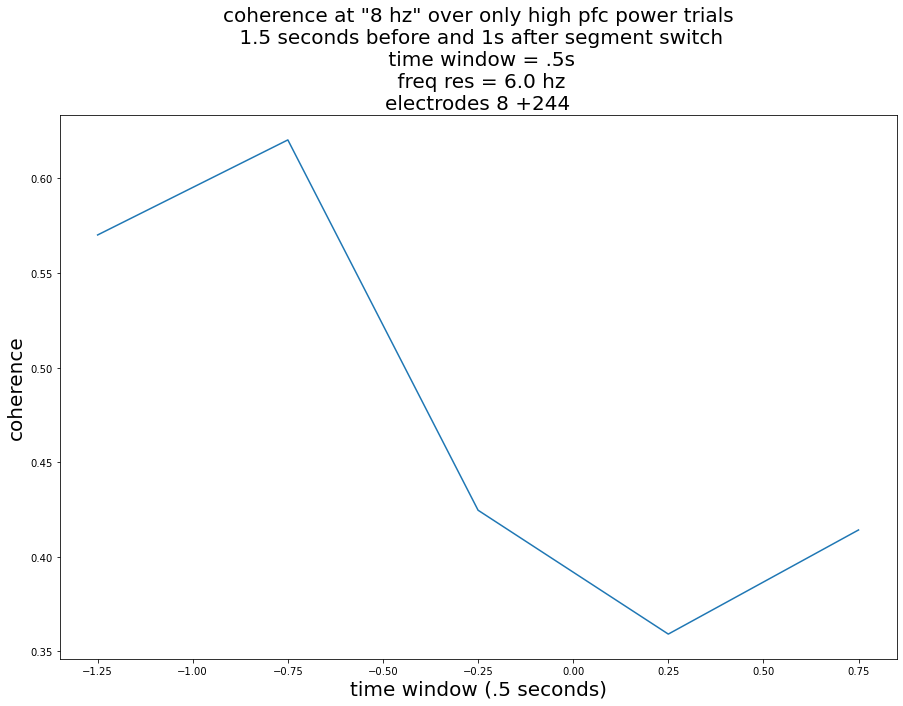

In [404]:
c.frequencies
freq_seg = c.frequencies[(c.frequencies == 8)]# & (c.frequencies <=9.5)]
coh_seg = c.coherence_magnitude()[..., 0, 1].squeeze().T[(c.frequencies == 8)]# & (c.frequencies <=9.5)]
coherency = c.coherency()[:, (c.frequencies == 8), 0, 1].squeeze()
power_pfc = c.power()[:,:,1].squeeze().T[(c.frequencies == 8)][0]
power_hpc = c.power()[:,:,0].squeeze().T[(c.frequencies == 8)][0]

coherency
plt.figure(figsize=(15,10))
plt.plot(x,coh_seg[0])
plt.title(f'coherence at "8 hz" over only high pfc power trials\n 1.5 seconds before and 1s after segment switch\n time window = .5s\n freq res = {m.frequency_resolution} hz\nelectrodes {electrode_id[electrode_ix1]} +{electrode_id[electrode_ix2]}',fontsize=20)
plt.xlabel('time window (.5 seconds)',fontsize=20)
plt.ylabel('coherence',fontsize=20)

Text(0, 0.5, 'power')

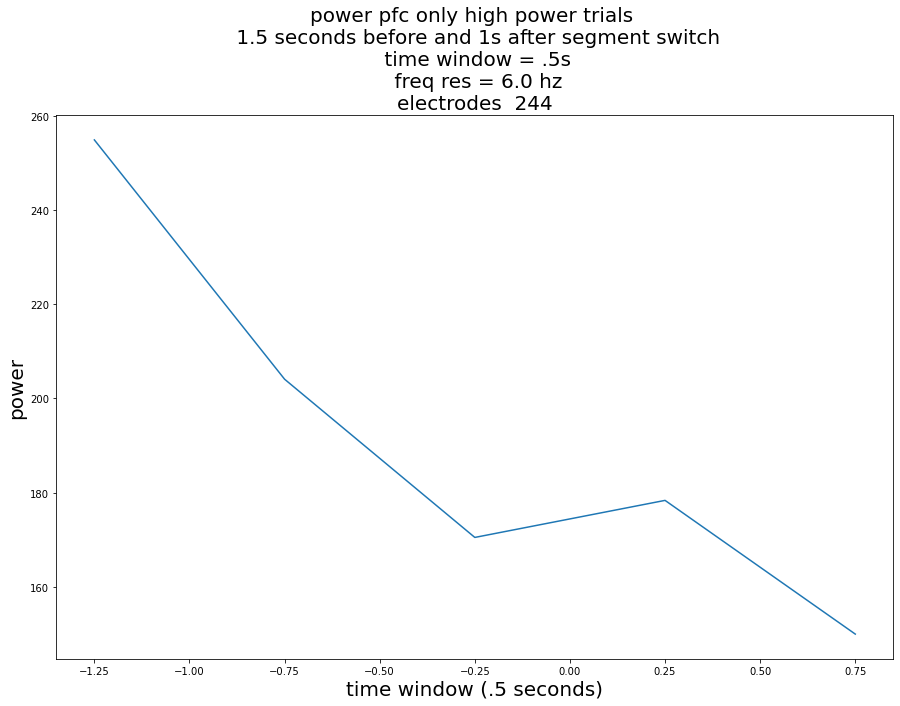

In [406]:
plt.figure(figsize=(15,10))
plt.plot(x,power_pfc)
plt.title(f'power pfc only high power trials \n 1.5 seconds before and 1s after segment switch\n time window = .5s\n freq res = {m.frequency_resolution} hz\nelectrodes  {electrode_id[electrode_ix2]}',fontsize=20)
plt.xlabel('time window (.5 seconds)',fontsize=20)
plt.ylabel('power',fontsize=20)

Text(0, 0.5, 'power')

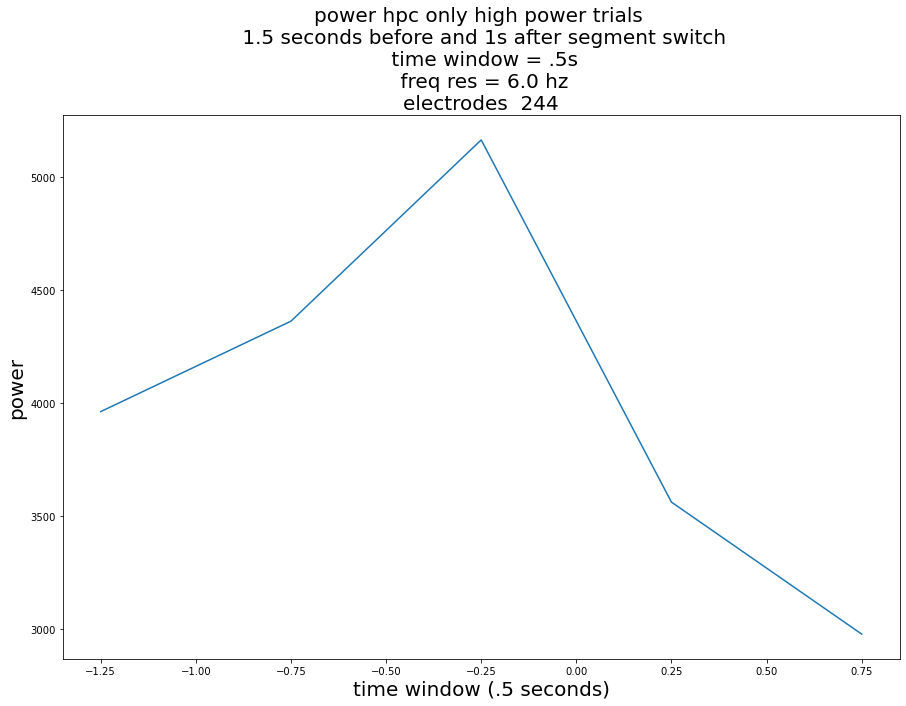

In [407]:
plt.figure(figsize=(15,10))
plt.plot(x,power_hpc)
plt.title(f'power hpc only high power trials \n 1.5 seconds before and 1s after segment switch\n time window = .5s\n freq res = {m.frequency_resolution} hz\nelectrodes  {electrode_id[electrode_ix2]}',fontsize=20)
plt.xlabel('time window (.5 seconds)',fontsize=20)
plt.ylabel('power',fontsize=20)

In [32]:
list_of_1_seg_switch

[0,
 1604078259.6768906,
 0,
 1604078279.2767003,
 1604078292.4099002,
 1604078301.8431363,
 1604078310.7763803,
 1604078314.476345,
 0,
 1604078328.8762062,
 0,
 1604078344.7760391,
 1604078356.3092668,
 0,
 1604078380.1756775,
 1604078383.7423227,
 1604078392.0755634,
 1604078395.0088663,
 0,
 1604078415.5753336,
 1604078423.2419229,
 1604078426.6085575,
 1604078433.8084772,
 1604078442.7083867,
 1604078450.3749812,
 1604078459.3082368,
 1604078467.1081433,
 1604078470.1747797,
 1604078473.2080834,
 1604078476.1747189,
 0,
 1604078489.1412644,
 1604078498.7744937,
 1604078502.9744592,
 1604078506.1411016,
 1604078508.9410658,
 1604078511.9410276,
 0,
 1604078523.8409228,
 1604078532.6408374,
 1604078537.3407867,
 0,
 1604078556.8072598,
 1604078560.4405515,
 1604078566.0738235,
 1604078569.573782,
 0,
 1604078581.5403328,
 0,
 1604078596.04019,
 1604078599.5401542,
 0,
 1604078605.57343,
 0,
 1604078620.6399572,
 1604078630.8731775,
 1604078635.0064778,
 1604078645.806363,
 160407865

In [37]:
list_of_1_seg_switch=[]
list_of_1_seg_switch.append(0)

for ix in range(len(trials_seg_switch_times)):
    seg_switch_times = trials_seg_switch_times[ix].tolist()
    # print(seg_switch_times)
    list_of_1_seg_switch.append(seg_switch_times)


In [38]:
trial_data_sesh['seg_switch_times'] = list_of_1_seg_switch

In [39]:
stay_trial_seg_switch_times = trial_data_sesh[trial_data_sesh.stem_switch==True].seg_switch_times

In [40]:
stay_trial_seg_switch_times

0                                                      0
2      [1604078268.4768033, 1604078268.810136, 160407...
8      [1604078322.6429179, 1604078323.642917, 160407...
10     [1604078334.542803, 1604078334.9428067, 160407...
13     [1604078368.5758092, 1604078368.6091342, 16040...
30     [1604078483.7413082, 1604078484.5746408, 16040...
37     [1604078514.6076698, 1604078515.4410026, 16040...
41     [1604078547.0406926, 1604078547.8406804, 16040...
48     [1604078589.2735987, 1604078590.140256, 160407...
53     [1604078615.5399883, 1604078616.339996, 160407...
65     [1604078689.2059205, 1604078689.9392574, 16040...
70     [1604078712.872362, 1604078713.0723531, 160407...
103    [1604078924.136913, 1604078924.170238, 1604078...
109    [1604078956.3365884, 1604078957.069925, 160407...
127    [1604079048.069007, 1604079048.1356778, 160407...
150    [1604079184.1676455, 1604079185.0343127, 16040...
Name: seg_switch_times, dtype: object

In [41]:
trial_keeper=[]
middle_of_switch_time=[]
for ix in range(1,len(stay_trial_seg_switch_times)):
    go_trial = stay_trial_seg_switch_times.iloc[ix]
    if len(go_trial) == 3: 
        trial_keeper.append(1)
        middle_of_switch_time.append(go_trial[1])
n_trials = sum(trial_keeper)

In [42]:
go_trial

[1604079184.1676455, 1604079185.0343127, 1604079185.8342993]

In [43]:
middle_of_switch_time

[1604078484.5746408,
 1604078515.4410026,
 1604078547.8406804,
 1604078590.140256,
 1604078616.339996,
 1604078689.9392574,
 1604079185.0343127]

In [540]:
electrode_id

[8, 17, 40, 132, 244, 300]

In [44]:
x = [i for i in np.arange(-4.75,5,.5)]
x

[-4.75,
 -4.25,
 -3.75,
 -3.25,
 -2.75,
 -2.25,
 -1.75,
 -1.25,
 -0.75,
 -0.25,
 0.25,
 0.75,
 1.25,
 1.75,
 2.25,
 2.75,
 3.25,
 3.75,
 4.25,
 4.75]

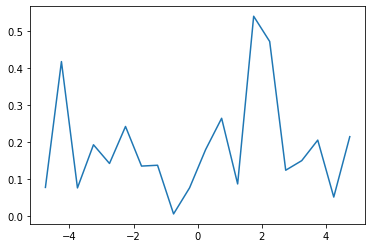

In [561]:
sampling_rate = sampling_rate_lfp
num_sec = 10
# n_trials = 1
n_signals= 2
n_time_samples = (num_sec*sampling_rate)

# inititalize "signal" which will contain alllll of trials of the data 
signal = np.zeros((int(n_time_samples), n_trials, n_signals))
signal_theta = np.zeros((int(n_time_samples), n_trials, n_signals))


#electrode indicces 
electrode_ix1 = 0
electrode_ix2 = 3
coher_keeper=[]
for ix in range(len(middle_of_switch_time)):
    time_start = np.array(middle_of_switch_time[ix]-5)
    time_end = np.array(middle_of_switch_time[ix]+5)
            # these functions will take the times and the eseries etc and will mask them and return the data for all electrodes in electrode id
            #also get the speed data using same methods, will append to keeping speed for later use  
    # electrode_id = [0,8,132]
    x_elect_lfp_eg1, y_elect_lfp_eg1 = get_x_y_timestamp_list(time_start, time_end, electrode_id, lfp_eseries, lfp_timestamps, lfp_data)
    x_elect_theta_eg1, y_elect_theta_eg1 = get_x_y_timestamp_list(time_start, time_end, electrode_id, theta_eseries, theta_timestamps, theta_data)




    signal[:,ix,0]= (y_elect_lfp_eg1[electrode_ix1])
    signal[:,ix,1]= (y_elect_lfp_eg1[electrode_ix2])

    signal_theta[:,ix,0]= (y_elect_theta_eg1[electrode_ix1])
    signal_theta[:,ix,1]= (y_elect_theta_eg1[electrode_ix2])


    
time, freq, mag, power,n_trials = multitaper_and_connectivity(signal,sampling_frequency,time_halfbandwidth_product,time_window_duration,time_window_step)


    # freq_seg = freq[0][(freq[0] == 8)]
coh_seg = mag()[..., 0, 1].squeeze().T[(freq[0] == 8)]
coher_keeper.append(coh_seg[0])

plt.plot(x,coher_keeper[0])



(3000, 7, 2)

In [ ]:
for ix in range(0,(n_trials)):
    plt.figure()
    plt.plot(signal[:,ix,0])
    

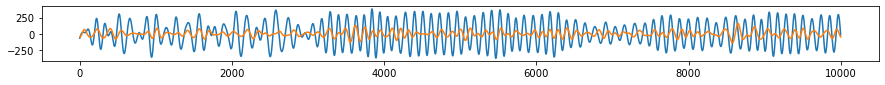

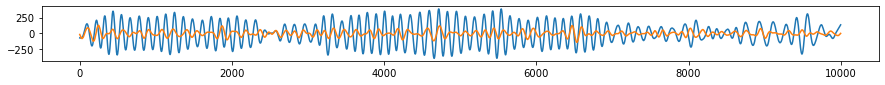

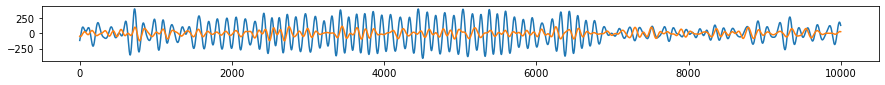

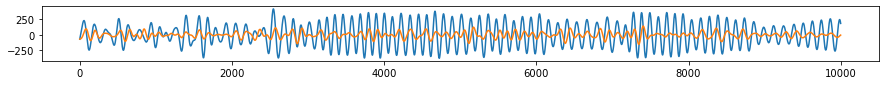

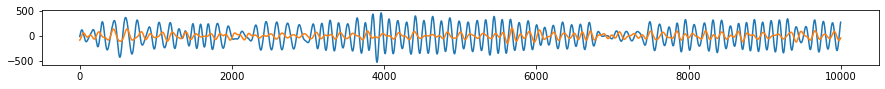

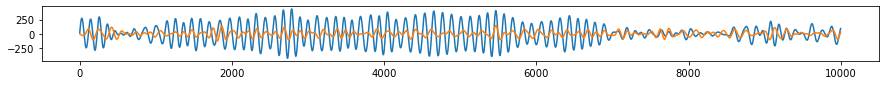

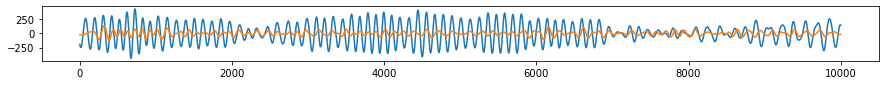

In [564]:
for ix in range(0,(n_trials)):
    plt.figure(figsize=(15,1))
    plt.plot(signal_theta[:,ix,0])
    plt.plot(signal_theta[:,ix,1])
    
    

In [643]:
x_speed.tolist()

[1604078483.0746634,
 1604078483.107988,
 1604078483.141313,
 1604078483.174659,
 1604078483.207984,
 1604078483.24133,
 1604078483.2746546,
 1604078483.3079796,
 1604078483.3413255,
 1604078483.3746505,
 1604078483.4079964,
 1604078483.4413211,
 1604078483.474646,
 1604078483.507992,
 1604078483.5413167,
 1604078483.5746417,
 1604078483.6079876,
 1604078483.6413126,
 1604078483.6746585,
 1604078483.7079833,
 1604078483.7413082,
 1604078483.7746542,
 1604078483.807979,
 1604078483.841325,
 1604078483.8746498,
 1604078483.9079747,
 1604078483.9413207,
 1604078483.9746456,
 1604078484.0079703,
 1604078484.0413163,
 1604078484.0746412,
 1604078484.1079872,
 1604078484.141312,
 1604078484.1746368,
 1604078484.2079828,
 1604078484.2413077,
 1604078484.2746537,
 1604078484.3079784,
 1604078484.3413033,
 1604078484.3746493,
 1604078484.4079742,
 1604078484.441299,
 1604078484.474645,
 1604078484.5079699,
 1604078484.5413158,
 1604078484.5746408,
 1604078484.6079655,
 1604078484.6413114,
 1604

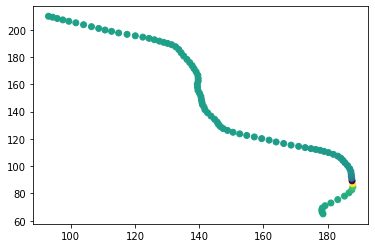

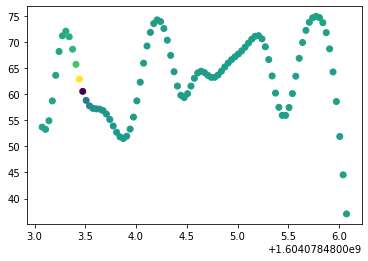

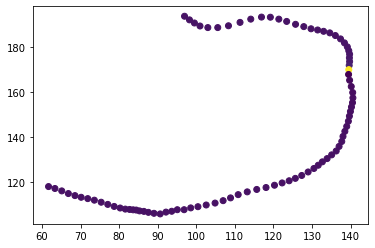

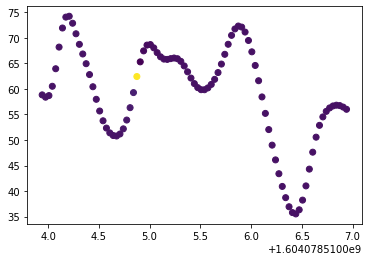

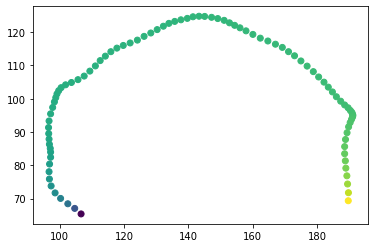

...

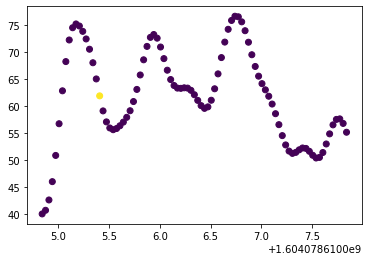

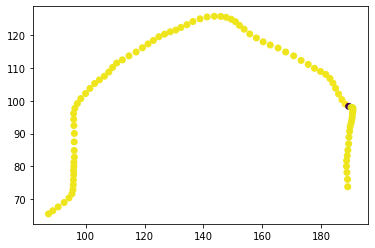

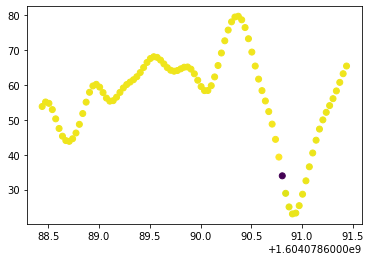

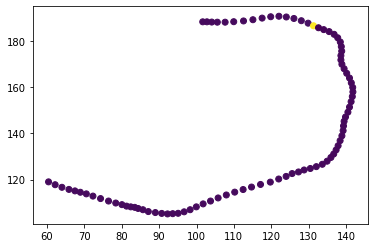

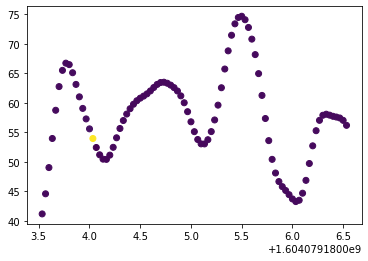

In [648]:
#this higlights that my switch trials arent as clean as i imagined. now i want to grab the times by the df. 
# plt.figure()

for ix in range(0,len(middle_of_switch_time)): 
    time_start = middle_of_switch_time[ix]-1.5
    time_end = middle_of_switch_time[ix]+1.5
    x_pos,y_pos = get_pos_timestamp(time_start,time_end,position_info)
    x_speed,y_speed = get_speed_timestamp(time_start,time_end,position_info)
    plt.figure()
    c = np.tan(x_speed.tolist())
    plt.scatter(x_pos,y_pos, c=c)
    
    plt.figure()
    c = np.tan(x_speed.tolist())
    plt.scatter(x_speed,y_speed, c= c)


    

In [574]:
trial_data_sesh

,nwb_file_name,epoch,trial_number_by_epoch,leaf,stem,reward,poke_in_ts,reward_on_ts,reward_off_ts,poke_out_ts,...,p_rew_leaf6,decay_percent,p_rew_reset_leaf1,p_rew_reset_leaf2,p_rew_reset_leaf3,p_rew_reset_leaf4,p_rew_reset_leaf5,p_rew_reset_leaf6,stem_switch,seg_switch_times
0,senor20201030_.nwb,2,0,4,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,0
1,senor20201030_.nwb,2,1,3,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604078259.6768906]
2,senor20201030_.nwb,2,2,2,A,0,1.604078e+09,NaN,NaN,1.604078e+09,...,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,"[1604078268.4768033, 1604078268.810136, 160407..."
3,senor20201030_.nwb,2,3,1,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604078279.2767003]
4,senor20201030_.nwb,2,4,2,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604078292.4099002]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,senor20201030_.nwb,2,175,6,C,0,1.604079e+09,NaN,NaN,1.604079e+09,...,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604079361.7658658]
176,senor20201030_.nwb,2,176,5,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604079364.9991605]
177,senor20201030_.nwb,2,177,6,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604079372.9324226]
178,senor20201030_.nwb,2,178,5,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604079385.2989662]


In [45]:
switch_times = trial_data_sesh[trial_data_sesh.stem_switch==True].seg_switch_times

In [633]:
range(len(switch_times))

range(0, 16)

In [ ]:
for ix in range(1,len(switch_times)):
    # print(switch_times.iloc[ix])
    mid_switch_time = (len(switch_times.iloc[ix]) - 1)/2
    middle_time=(switch_times.iloc[ix])[int(mid_switch_time)]
    time_start = middle_time-1.5
    time_end = middle_time+1.5
    x_pos,y_pos = get_pos_timestamp(time_start,time_end,position_info)
    plt.figure()
    plt.plot(x_pos,y_pos)
    plt.xlim(50,200)
    plt.ylim(50,200)



In [597]:
middleIndex = (len(switch_times.iloc[ix]) - 1)/2
middle_time=(switch_times.iloc[ix])[int(middleIndex)]

In [590]:
middleIndex

1.0

In [595]:
(switch_times.iloc[ix])

[1604079184.1676455, 1604079185.0343127, 1604079185.8342993]

In [614]:
trial_len_keeper=[]
for ix in range(len(trial_data_sesh)):
    if trial_data_sesh.iloc[ix].stem_switch ==True: 
        trial_len = trial_data_sesh.iloc[ix].poke_in_ts - trial_data_sesh.iloc[ix-1].poke_out_ts
        trial_len_keeper.append(trial_len)

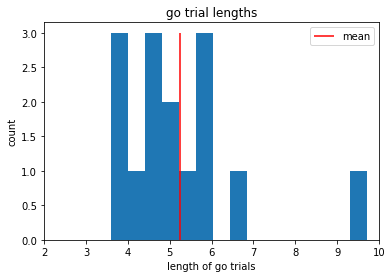

In [626]:
plt.hist(trial_len_keeper[1:],bins=len(trial_len_keeper)-1)
plt.title('go trial lengths')
plt.xlabel('length of go trials')
plt.ylabel('count')
plt.xlim(2,10)
plt.vlines(statistics.mean(trial_len_keeper[1:]),0,3,color='r',label='mean')
plt.legend()

In [649]:
# should plot speed of each trial with segment switch times marked 
#or, jsut generally see how much time between each segment change 

In [652]:
for ix in range(len(stay_trial_seg_switch_times)):
    one_trial= stay_trial_seg_switch_times.iloc[ix]


In [653]:
one_trial

[1604079184.1676455, 1604079185.0343127, 1604079185.8342993]

In [654]:
trial_data_sesh

,nwb_file_name,epoch,trial_number_by_epoch,leaf,stem,reward,poke_in_ts,reward_on_ts,reward_off_ts,poke_out_ts,...,p_rew_leaf6,decay_percent,p_rew_reset_leaf1,p_rew_reset_leaf2,p_rew_reset_leaf3,p_rew_reset_leaf4,p_rew_reset_leaf5,p_rew_reset_leaf6,stem_switch,seg_switch_times
0,senor20201030_.nwb,2,0,4,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,0
1,senor20201030_.nwb,2,1,3,B,0,1.604078e+09,NaN,NaN,1.604078e+09,...,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604078259.6768906]
2,senor20201030_.nwb,2,2,2,A,0,1.604078e+09,NaN,NaN,1.604078e+09,...,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,"[1604078268.4768033, 1604078268.810136, 160407..."
3,senor20201030_.nwb,2,3,1,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604078279.2767003]
4,senor20201030_.nwb,2,4,2,A,1,1.604078e+09,1.604078e+09,1.604078e+09,1.604078e+09,...,80,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604078292.4099002]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,senor20201030_.nwb,2,175,6,C,0,1.604079e+09,NaN,NaN,1.604079e+09,...,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604079361.7658658]
176,senor20201030_.nwb,2,176,5,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604079364.9991605]
177,senor20201030_.nwb,2,177,6,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604079372.9324226]
178,senor20201030_.nwb,2,178,5,C,1,1.604079e+09,1.604079e+09,1.604079e+09,1.604079e+09,...,50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,[1604079385.2989662]


1.0844552516937256 0.8333325386047363 0.7333366870880127 0.9398753643035889
1.0858168601989746 0.8333327770233154 0.7666614055633545 1.1101889610290527
2.4658396244049072 0.79998779296875 0.7666621208190918 0.9955103397369385
1.2537457942962646 0.8666572570800781 2.93330454826355 0.9822924137115479
1.2721354961395264 0.8000078201293945 0.7333154678344727 0.9855413436889648
3.2040677070617676 0.7333369255065918 0.7666614055633545 1.1039340496063232
1.419792652130127 0.8666672706604004 0.7999866008758545 1.111553430557251


([<matplotlib.axis.XTick at 0x7fe215c4dc70>,
 [Text(0, 0, 'out:leaf'),
  Text(1, 0, 'leaf to stem'),
  Text(2, 0, 'stem to leaf'),
  Text(3, 0, 'leaf to in')])

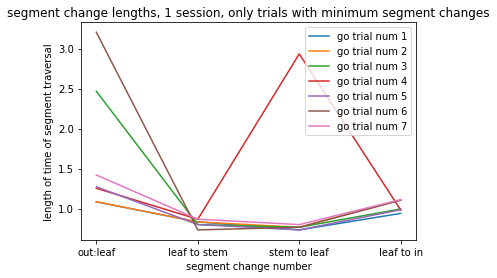

In [674]:
counter = 1
for ix in range(1,len(trial_data_sesh)): 
    if trial_data_sesh.iloc[ix].stem_switch==True: 
        if len(trial_data_sesh.iloc[ix].seg_switch_times) ==3:
            trial_seg_times=[]
            trial_start = trial_data_sesh.iloc[ix-1].poke_out_ts
            trial_end = trial_data_sesh.iloc[ix].poke_in_ts
            segment_change_times = trial_data_sesh.iloc[ix].seg_switch_times
            seg_1 = segment_change_times[0]-trial_start
            seg_2 = segment_change_times[1]-segment_change_times[0]
            seg_3 = segment_change_times[2]-segment_change_times[1]
            seg_4=trial_end - segment_change_times[2]
            trial_seg_times.append([seg_1,seg_2,seg_3,seg_4])
            print(seg_1,seg_2,seg_3,seg_4)
            # plt.figure()
            plt.plot(trial_seg_times[0],label=f'go trial num {counter}')
            counter= counter+1
            plt.legend()
plt.title('segment change lengths, 1 session, only trials with minimum segment changes')
plt.xlabel('segment change number')
plt.ylabel('length of time of segment traversal')
plt.xticks([0,1,2,3],['out:leaf','leaf to stem','stem to leaf','leaf to in'])

In [664]:
trial_data_sesh.iloc[ix].seg_switch_times

0

In [ ]:
#should also see whats happening when theres more than 3 segment changes. which ones tok eep, which to exclude. 